In [1]:
from transformers import Sam3Processor, Sam3Model
import torch
from PIL import Image
import numpy as np
from pathlib import Path
import time

# Env loading
from dotenv import load_dotenv
import os

load_dotenv()
hf_token = os.getenv("HF_TOKEN")
os.environ["HF_HOME"] = "./models_cache/SAM_original/"

import sys

sys.path.append("..")
from animgen.core.generated_asset_class import GeneratedAssetClass

from IPython.display import display

/media/kahnsvaer/Datasets/PsnlProjects/AnimationGenerationGSoC/.venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
VIEW = 13
MESH_PATH = Path("../generated_data/models/img_mesh_Goldfish.glb")
MODEL_PATH = "facebook/sam3"
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

In [3]:
# Generating View
mesh = GeneratedAssetClass(MESH_PATH)

view_outputs = mesh.views_output


Rendering Multiviews...: 100%|██████████| 20/20 [00:05<00:00,  3.80it/s]


In [4]:
images = view_outputs['matte']

In [5]:
# MODEL SETUP
model = Sam3Model.from_pretrained(MODEL_PATH).to(DEVICE)
processor = Sam3Processor.from_pretrained(MODEL_PATH)

Loading weights: 100%|██████████| 1468/1468 [00:00<00:00, 9135.38it/s]


In [6]:
prompts = ["tail",]

text_inputs = processor(
    text=prompts,
    return_tensors="pt"
).to(model.device)

with torch.no_grad():
    text_embeds = model.get_text_features(**text_inputs)

attention_mask = text_inputs.attention_mask

In [7]:
results = []
for i, image in enumerate(images):
    print(f"Processing image {i+1}/{len(images)}")
    image_inputs = processor(images=image, return_tensors="pt").to(model.device)

    with torch.no_grad():
        vision_embeds = model.get_vision_features(pixel_values=image_inputs.pixel_values)

        outputs = model(
            vision_embeds=vision_embeds,
            text_embeds=text_embeds,
            attention_mask=text_inputs.attention_mask,
        )
        result = processor.post_process_instance_segmentation(
            outputs,
            threshold=0.5,
            mask_threshold=0.5,
            target_sizes=image_inputs["original_sizes"].tolist()
        )[0]
        result['images'] = image

    results.append(result)

    del vision_embeds
    del outputs
    del image_inputs
    del image


Processing image 1/20
Processing image 2/20
Processing image 3/20
Processing image 4/20
Processing image 5/20
Processing image 6/20
Processing image 7/20
Processing image 8/20
Processing image 9/20
Processing image 10/20
Processing image 11/20
Processing image 12/20
Processing image 13/20
Processing image 14/20
Processing image 15/20
Processing image 16/20
Processing image 17/20
Processing image 18/20
Processing image 19/20
Processing image 20/20


Mask 0, score 0.6509


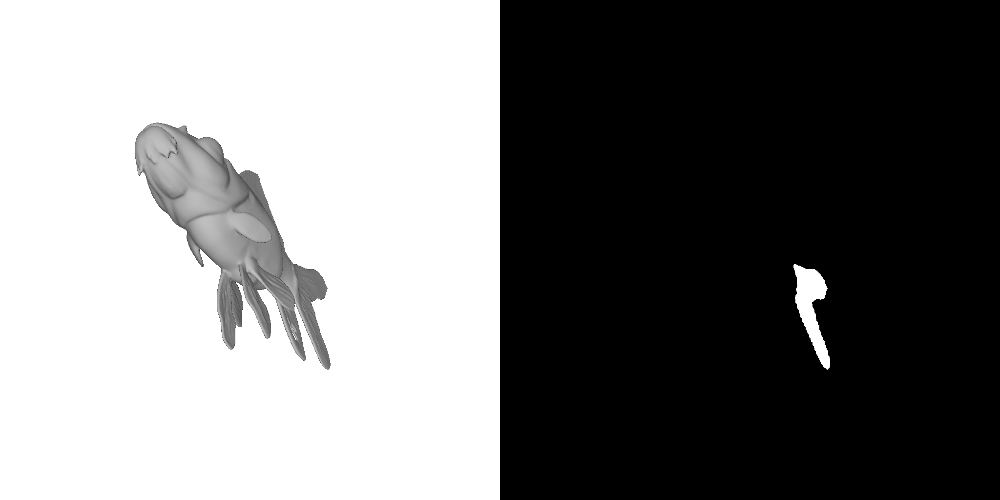

Mask 1, score 0.9263


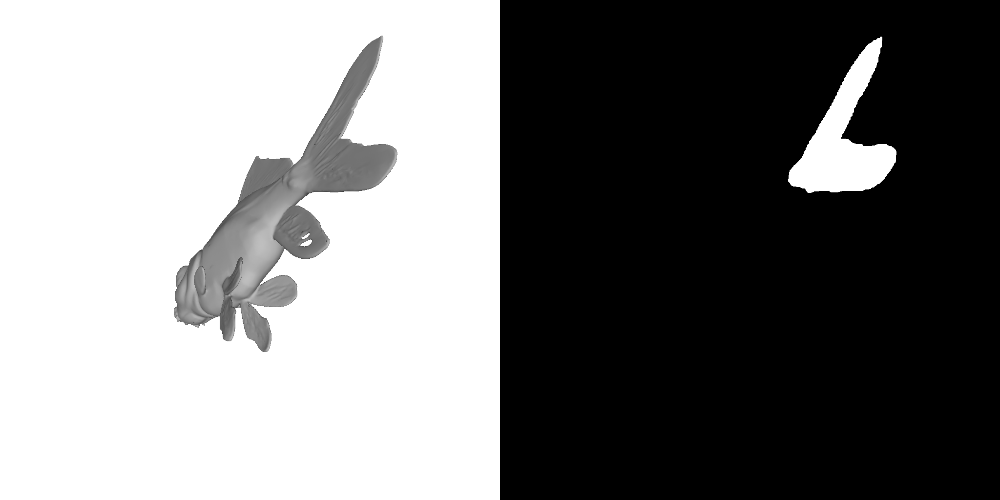

Mask 2, score 0.8497


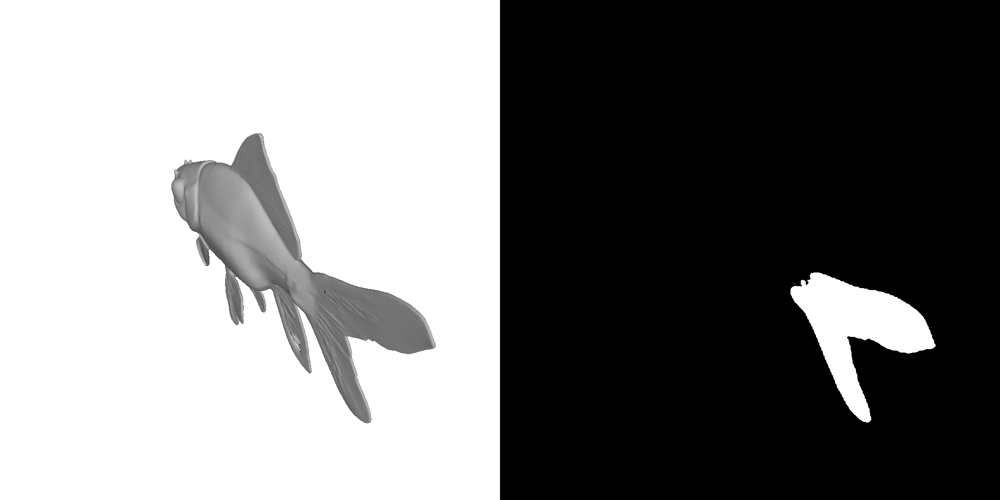

Mask 3, score 0.9379


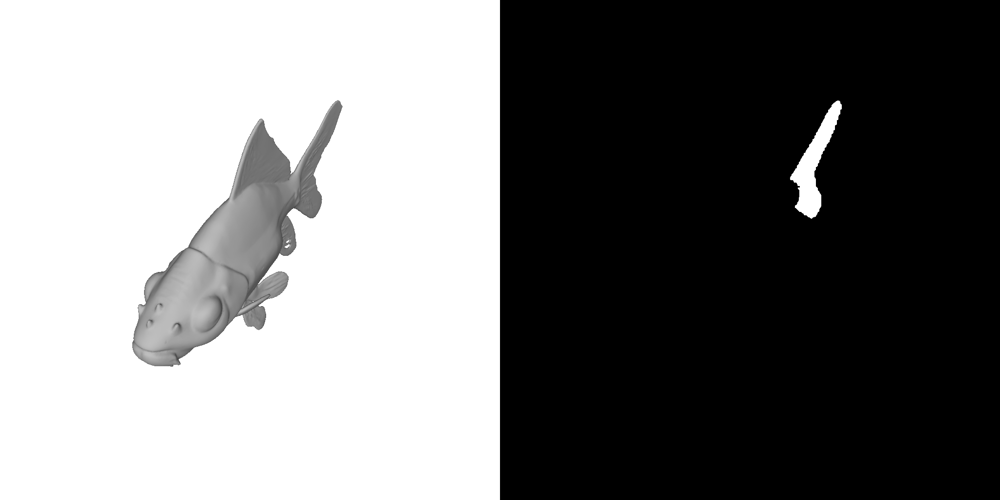

Mask 4, score 0.7341


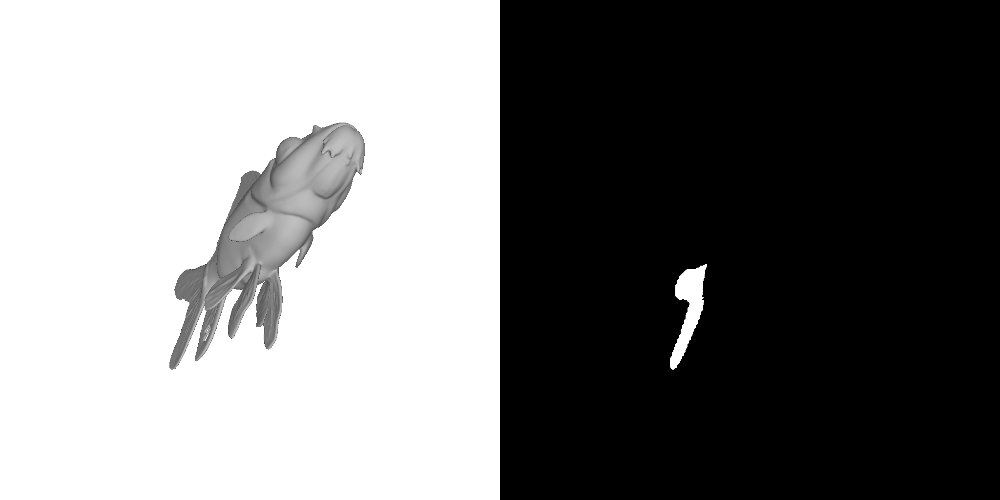

Mask 5, score 0.8900


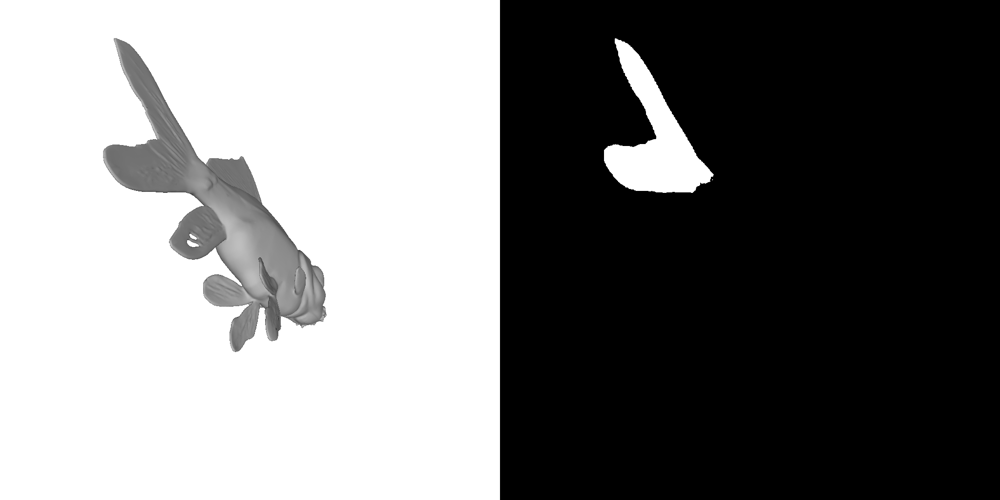

Mask 6, score 0.8454


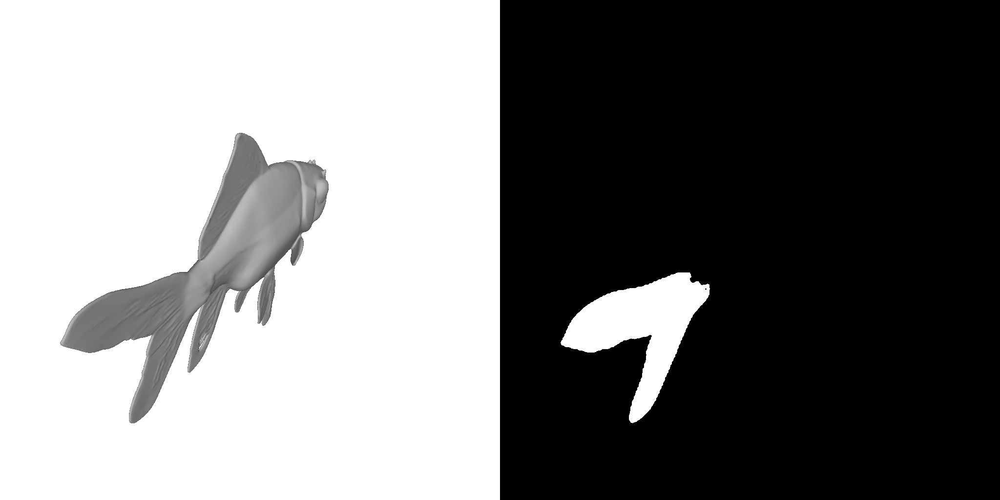

Mask 7, score 0.9149


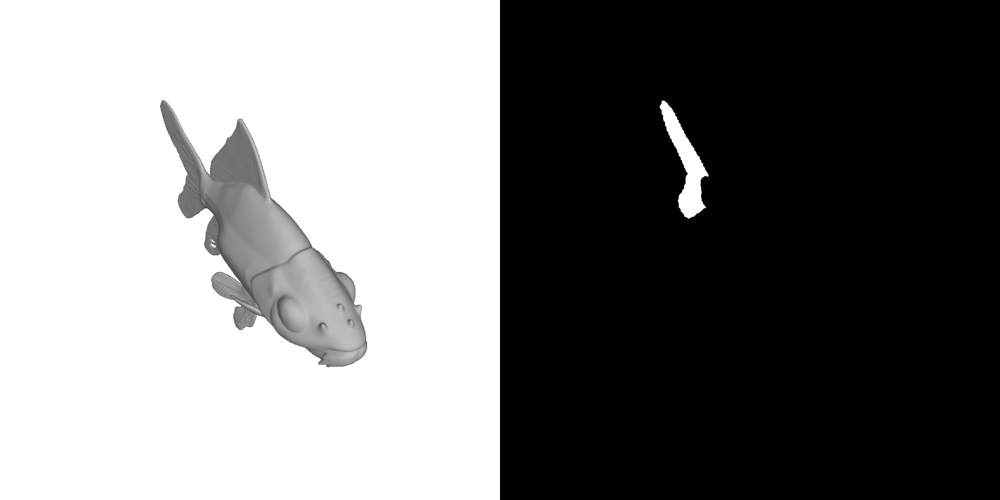

Mask 8, score 0.9376


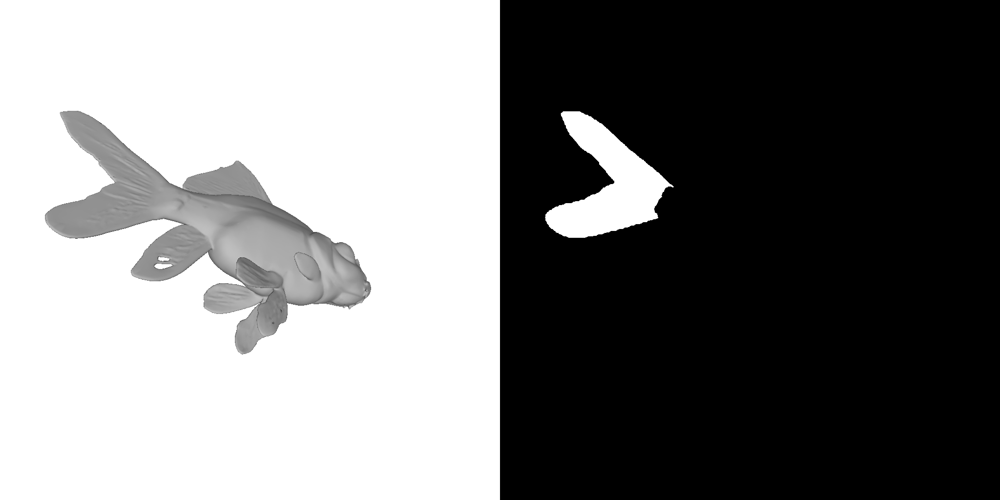

Mask 9, score 0.9180


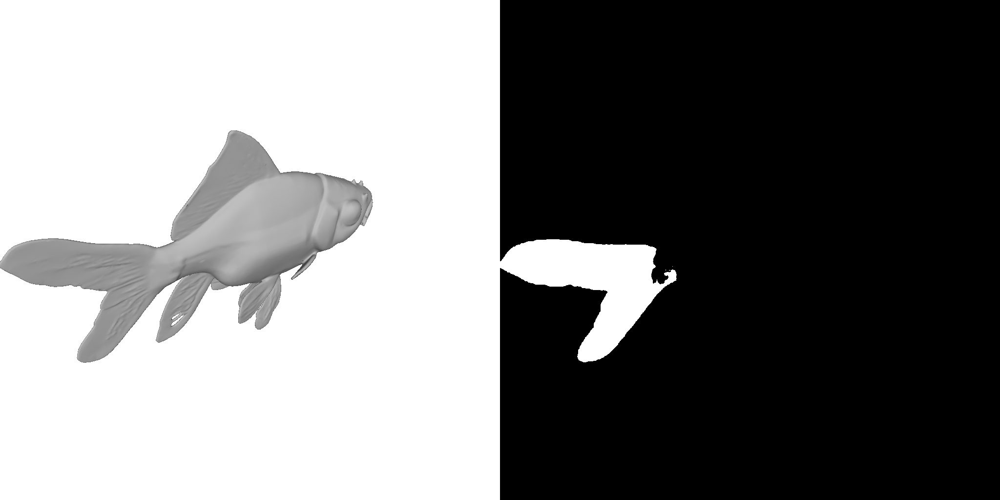

Mask 10, score 0.9494


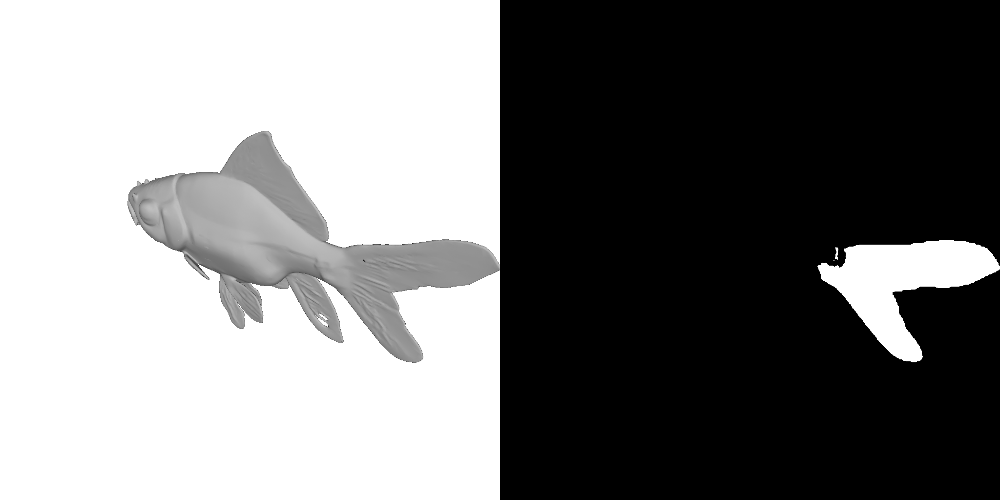

Mask 11, score 0.9206


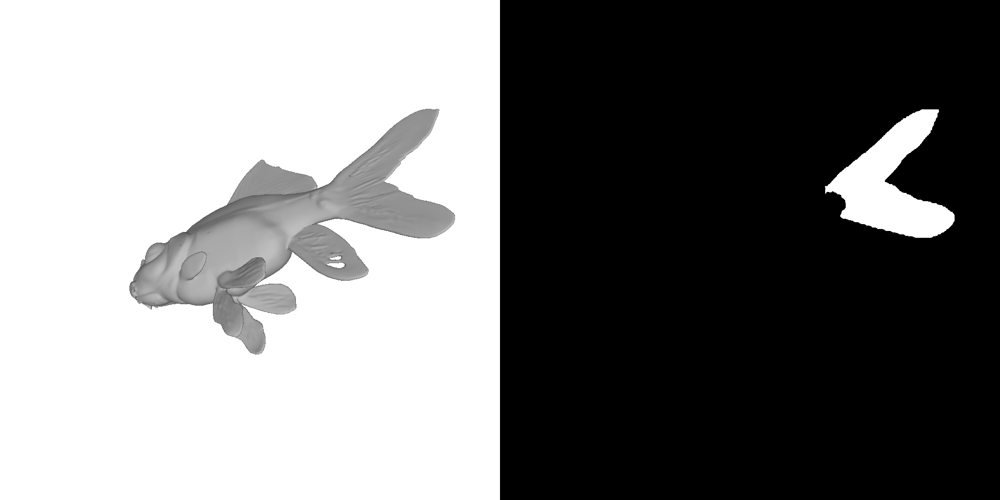

Mask 12, score 0.7113


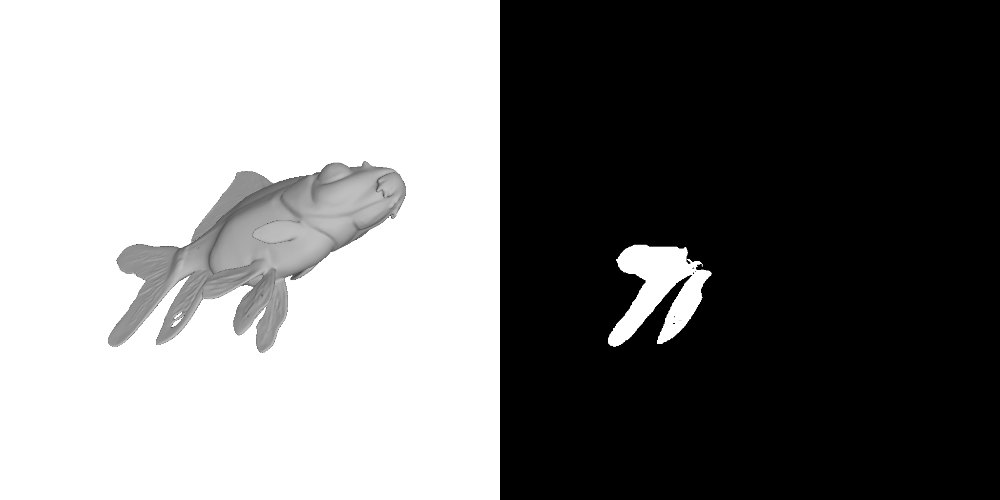

Mask 13, score 0.9253


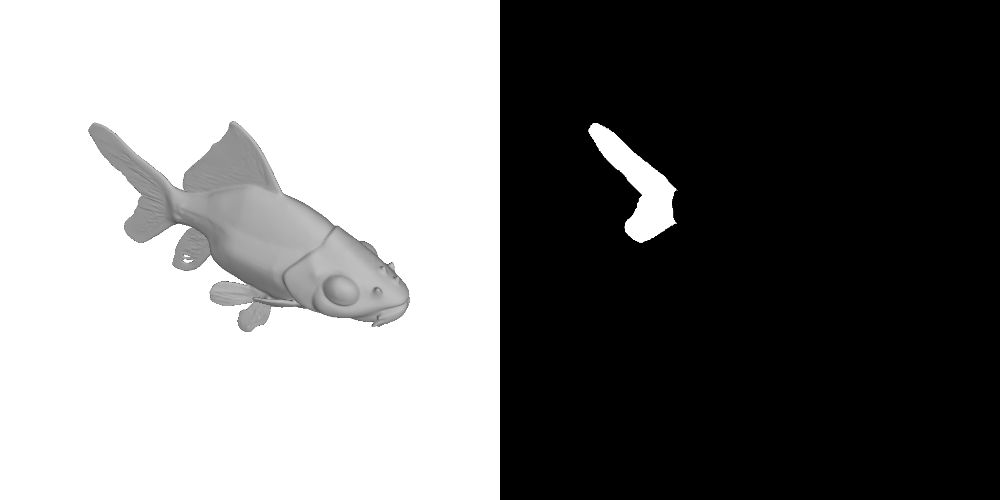

Mask 14, score 0.9032


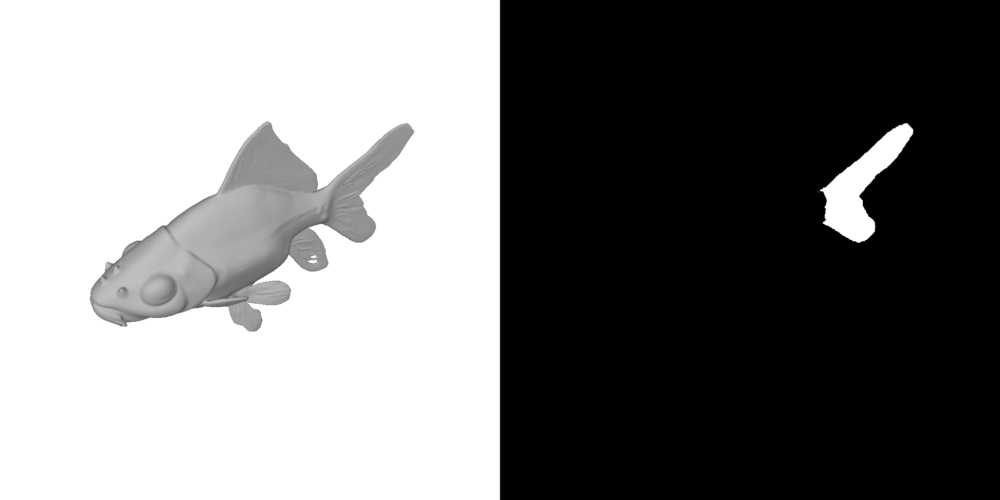

Mask 15, score 0.7883


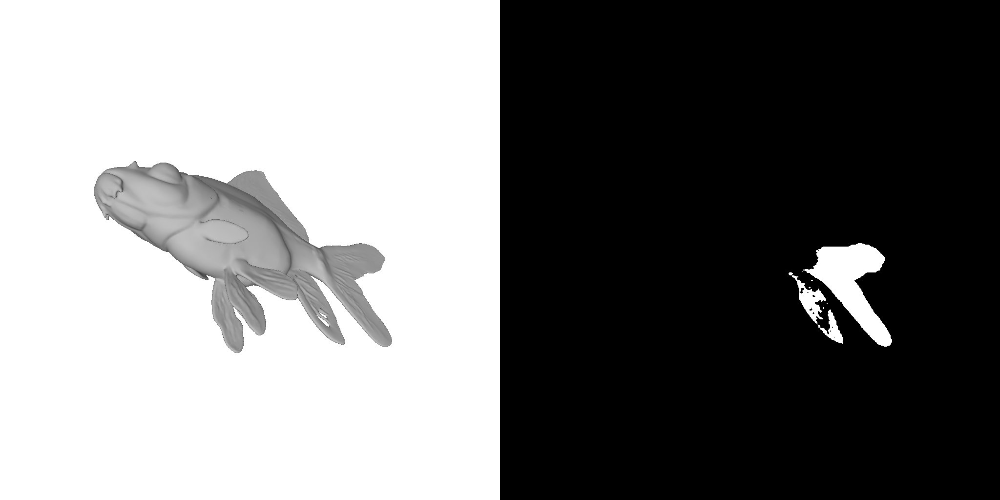

Mask 16, score 0.9183


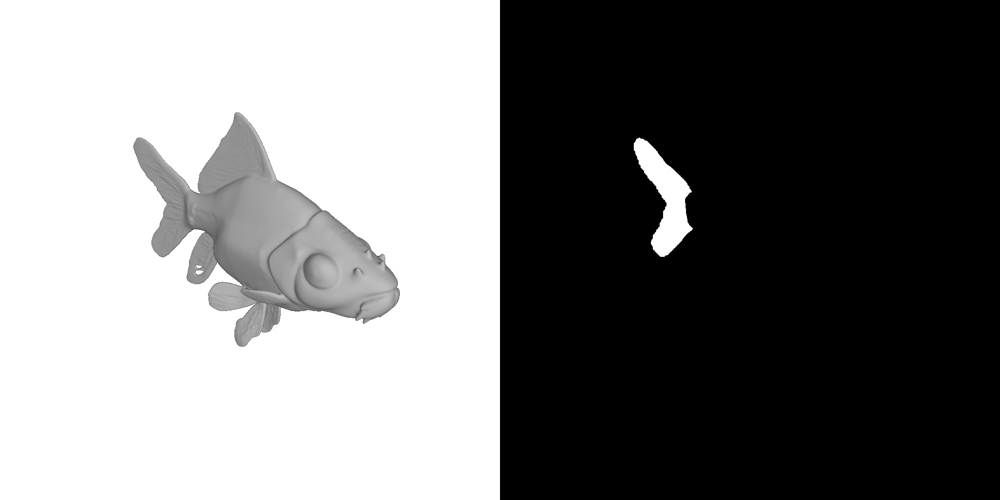

Mask 17, score 0.9302


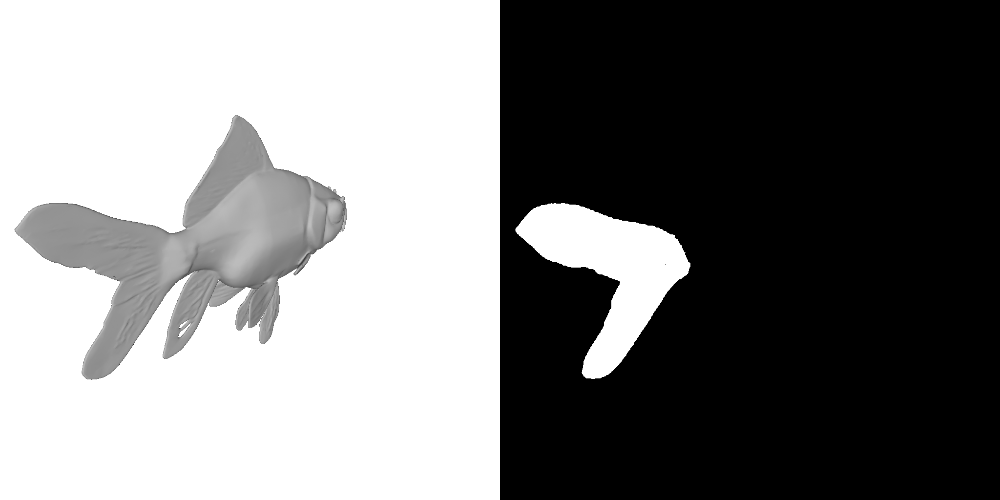

Mask 18, score 0.9526


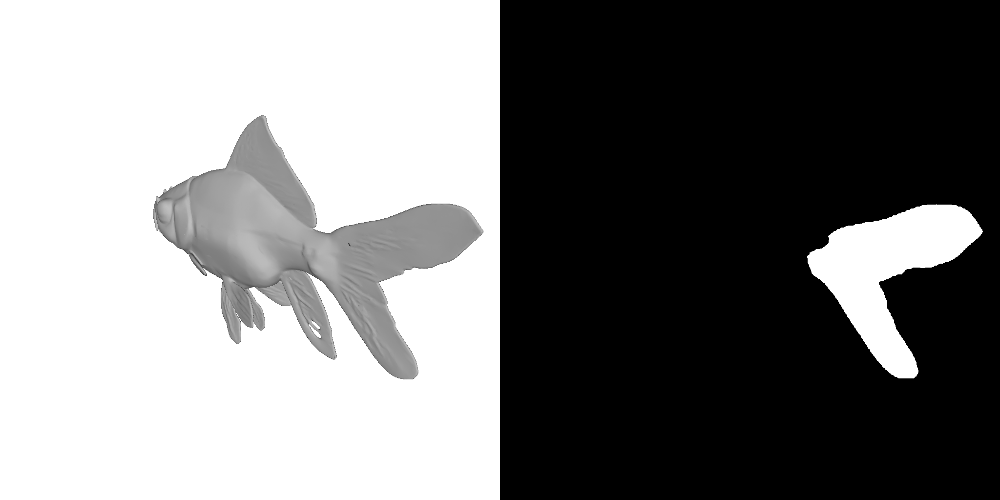

Mask 19, score 0.9346


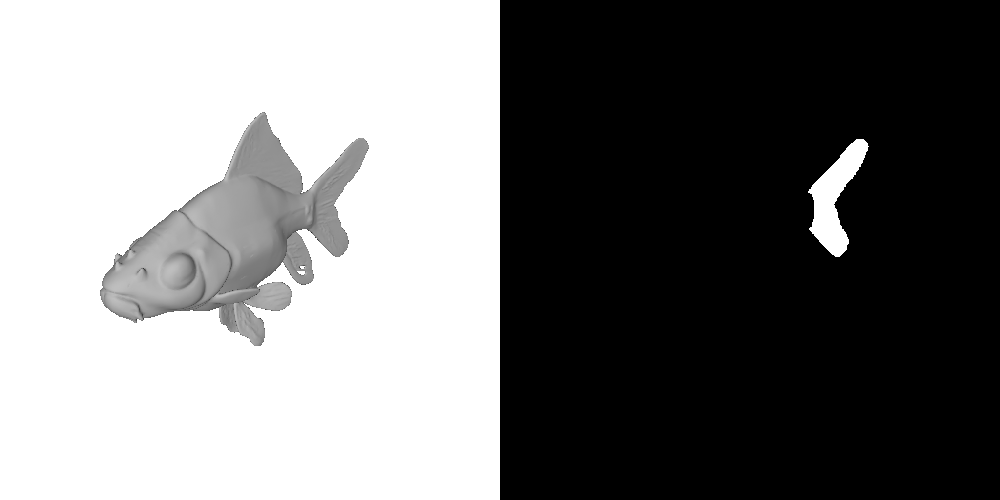

In [8]:
for i, result in enumerate(results):
    mask = result["masks"].cpu().numpy()[0]
    mask = Image.fromarray((mask * 255).astype(np.uint8)).convert("RGB")

    score = result["scores"].cpu().numpy()
    image = result["images"]

    combined = Image.new("RGB", (image.width + mask.width, image.height))
    combined.paste(image, (0, 0))
    combined.paste(mask, (image.width, 0))

    print(f"Mask {i}, score {score[0]:.4f}")
    display(combined)

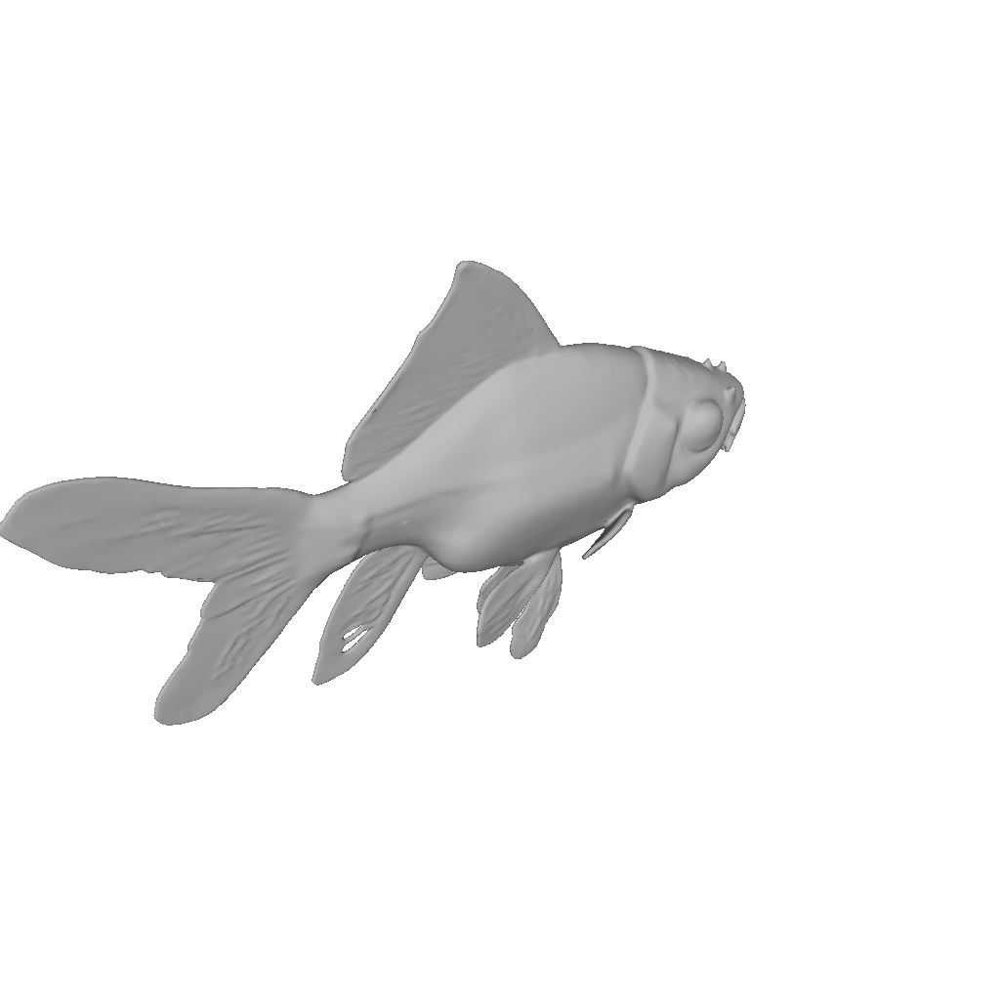

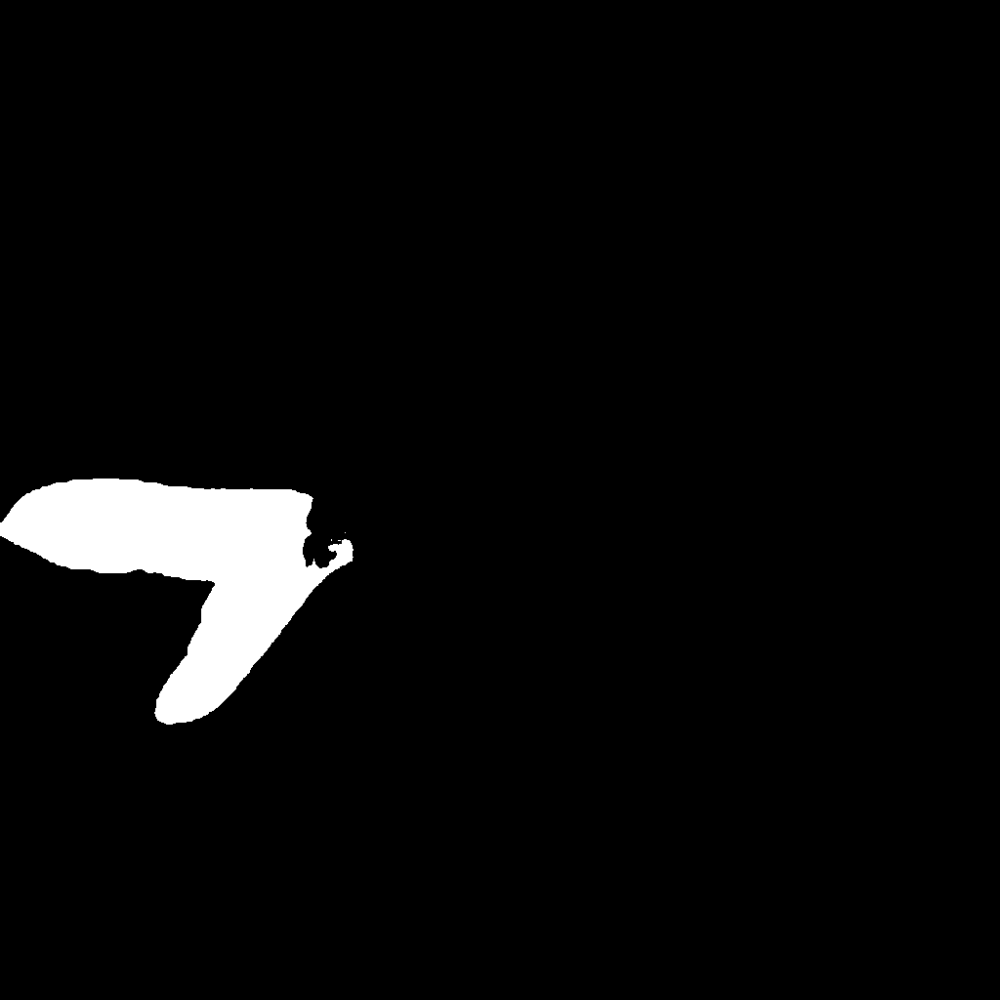

In [9]:
chosen_int = 9
chosen_result = results[chosen_int]

chosen_mask = mask = chosen_result["masks"].cpu().numpy()[0]
chosen_mask_image = Image.fromarray((chosen_mask * 255).astype(np.uint8)).convert("RGB")

chosen_faces = view_outputs['faces'][chosen_int]

display(chosen_result['images'])
display(chosen_mask_image)

In [10]:
import numpy as np

masked_pixels = chosen_mask > 0
masked_face_ids = chosen_faces[masked_pixels]

masked_face_ids = masked_face_ids[masked_face_ids >= 0]

selected_faces = np.unique(masked_face_ids)

print(f"Recovered {len(selected_faces)} mesh faces")
print(selected_faces[:20])

Recovered 3533 mesh faces
[40182 40184 40185 40187 40189 40294 40296 40297 40299 40302 40304 40306
 40311 40417 40419 40422 40424 40425 40426 40428]


In [11]:
print(chosen_faces.min(), chosen_faces.max())
print(chosen_faces.shape)
print(selected_faces.shape)

-1 49984
(1024, 1024)
(3533,)


In [12]:
import numpy as np

tm_mesh = mesh.mesh
# RGBA colors
face_colors = np.tile(
    np.array([180, 180, 180, 255], dtype=np.uint8),
    (len(tm_mesh.faces), 1)
)

face_colors[selected_faces] = np.array([255, 0, 0, 255], dtype=np.uint8)

tm_mesh.visual.face_colors = face_colors

tm_mesh.show()

In [13]:
all_selected_faces = set()

for i in range(len(results)):
    chosen_result = results[i]

    chosen_mask = chosen_result["masks"].cpu().numpy()[0]
    chosen_faces = view_outputs["faces"][i]

    masked_pixels = chosen_mask > 0

    # Face IDs at those pixels
    masked_face_ids = chosen_faces[masked_pixels]
    masked_face_ids = masked_face_ids[masked_face_ids >= 0]
    all_selected_faces.update(masked_face_ids.tolist())

selected_faces = np.array(sorted(all_selected_faces), dtype=np.int32)

print(f"Recovered {len(selected_faces)} unique faces.")

Recovered 11184 unique faces.


In [14]:
tm_mesh = mesh.mesh

face_colors = np.tile(
    np.array([180, 180, 180, 255], dtype=np.uint8),
    (len(tm_mesh.faces), 1)
)

face_colors[selected_faces] = np.array([255, 0, 0, 255], dtype=np.uint8)

tm_mesh.visual.face_colors = face_colors

tm_mesh.show()